# 2D Soft Body Dynamics with NVIDIA warp

This self-contained tutorial implements 2D soft body simulation using **NVIDIA Warp**.

**Learning Goals:**
1. Understand explicit vs implicit time integration
2. Implement spring forces (Hooke's Law)
3. Implement FEM forces (Neo-Hookean material)
4. Build sparse linear system solvers

## 1. The Physics

Soft bodies follow Newton's second law:
$$\mathbf{M}\ddot{\mathbf{x}} = \mathbf{f}(\mathbf{x}, \mathbf{v})$$

**The Challenge:** Stiff springs require tiny timesteps with explicit methods.

## 2. Time Integration

### Explicit Euler
Forces at **current** time → simple but needs tiny $\Delta t$:
$$\mathbf{v}_{n+1} = \mathbf{v}_n + \Delta t \cdot \mathbf{M}^{-1} \mathbf{f}(\mathbf{x}_n)$$

### Implicit Euler  
Forces at **future** time → stable, allows large $\Delta t$:
$$\mathbf{v}_{n+1} = \mathbf{v}_n + \Delta t \cdot \mathbf{M}^{-1} \mathbf{f}(\mathbf{x}_{n+1})$$

Requires solving: $\mathbf{A}\Delta\mathbf{v} = \mathbf{b}$ where $\mathbf{A} = \mathbf{M} - \Delta t^2 \mathbf{K}$

## 3. Force Models

**Springs:** $f = k(L - L_0)$ — Hooke's Law

**FEM:** Uses deformation gradient $\mathbf{F}$ with Neo-Hookean material:
- Deviatoric (shape): $I_C = \text{tr}(\mathbf{F}^T\mathbf{F})$
- Volumetric (area): $J = \det(\mathbf{F})$

FEM provides **volume preservation** that springs cannot!

---
## 4. Implementation

Step-by-step GPU implementation using Warp.

In [34]:
# Step 1: Imports
import numpy as np
import warp as wp
from warp.optim.linear import bicgstab, preconditioner
from warp.sparse import bsr_zeros, bsr_set_from_triplets
from scipy.spatial import Delaunay
import matplotlib.pyplot as plt
from matplotlib.tri import Triangulation
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import Image
import time

wp.init()
print(f"Warp {wp.__version__} on {wp.get_device()}")

Warp 1.11.0.dev20251123 on cuda:0


### 4.1 Spring Force Kernel

Compute spring forces using Hooke's Law:
- **Spring force:** $f = k_s(L - L_0)$
- **Damping:** $f_d = k_d \dot{L}$

In [35]:
# Step 2: Spring Force Kernel
@wp.kernel
def eval_spring_2d(
    x: wp.array(dtype=wp.vec2),           # Positions
    v: wp.array(dtype=wp.vec2),           # Velocities
    spring_indices: wp.array(dtype=int),   # Particle pairs
    spring_rest_lengths: wp.array(dtype=float),
    spring_stiffness: wp.array(dtype=float),
    spring_damping: wp.array(dtype=float),
    f: wp.array(dtype=wp.vec2),           # Output forces
    spring_strains: wp.array(dtype=float), # Output strains
):
    tid = wp.tid()
    i = spring_indices[tid * 2 + 0]
    j = spring_indices[tid * 2 + 1]
    if i == -1 or j == -1:
        return
    
    ke = spring_stiffness[tid]
    kd = spring_damping[tid]
    rest = spring_rest_lengths[tid]
    
    xij = x[i] - x[j]
    vij = v[i] - v[j]
    L = wp.length(xij)
    
    if L < 1e-6:
        spring_strains[tid] = 0.0
        return
    
    d_hat = xij / L
    extension = L - rest
    L_dot = wp.dot(d_hat, vij)
    
    spring_strains[tid] = extension / rest
    force = d_hat * (ke * extension + kd * L_dot)
    
    wp.atomic_sub(f, i, force)
    wp.atomic_add(f, j, force)

print("Spring kernel defined")

Spring kernel defined


### 4.2 Integration Kernels

**Symplectic Euler** (leapfrog):
1. Half-kick velocity
2. Drift position  
3. Second half-kick

In [36]:
# Step 3: Integration Kernels
@wp.kernel
def integrate_particles_2d(
    x: wp.array(dtype=wp.vec2), v: wp.array(dtype=wp.vec2),
    f: wp.array(dtype=wp.vec2), inv_mass: wp.array(dtype=float),
    gravity: wp.vec2, dt: float,
    x_new: wp.array(dtype=wp.vec2), v_new: wp.array(dtype=wp.vec2),
):
    tid = wp.tid()
    acc = f[tid] * inv_mass[tid] + gravity
    v_half = v[tid] + acc * (dt / 2.0)
    x_new[tid] = x[tid] + v_half * dt
    v_new[tid] = v_half


@wp.kernel
def finalize_velocity_2d(
    v: wp.array(dtype=wp.vec2), f: wp.array(dtype=wp.vec2),
    inv_mass: wp.array(dtype=float), gravity: wp.vec2, dt: float,
    v_new: wp.array(dtype=wp.vec2),
):
    tid = wp.tid()
    acc = f[tid] * inv_mass[tid] + gravity
    v_new[tid] = v[tid] + acc * (dt / 2.0)


@wp.kernel
def apply_boundary_2d(x: wp.array(dtype=wp.vec2), v: wp.array(dtype=wp.vec2), boxsize: float):
    tid = wp.tid()
    pos = x[tid]
    vel = v[tid]
    if pos[0] < 0.0:
        pos = wp.vec2(-pos[0], pos[1])
        vel = wp.vec2(-vel[0], vel[1])
    elif pos[0] > boxsize:
        pos = wp.vec2(2.0*boxsize - pos[0], pos[1])
        vel = wp.vec2(-vel[0], vel[1])
    if pos[1] < 0.0:
        pos = wp.vec2(pos[0], -pos[1])
        vel = wp.vec2(vel[0], -vel[1])
    elif pos[1] > boxsize:
        pos = wp.vec2(pos[0], 2.0*boxsize - pos[1])
        vel = wp.vec2(vel[0], -vel[1])
    x[tid] = pos
    v[tid] = vel

print("Integration kernels defined")

Integration kernels defined


### 4.3 FEM Force Kernel

**Neo-Hookean material** for volume preservation:
- Deformation gradient: $\mathbf{F} = \mathbf{D}_s \mathbf{D}_m^{-1}$
- Deviatoric stress: Resists shape change ($\mu$)
- Volumetric stress: Resists area change ($\lambda$)

In [37]:
# Step 4: FEM Force Kernel
@wp.kernel
def eval_fem_2d(
    x: wp.array(dtype=wp.vec2), v: wp.array(dtype=wp.vec2),
    indices: wp.array(dtype=int), pose: wp.array(dtype=wp.mat22),
    materials: wp.array(dtype=wp.vec3), f: wp.array(dtype=wp.vec2),
    tri_strains: wp.array(dtype=float),
):
    tid = wp.tid()
    i = indices[tid * 3 + 0]
    j = indices[tid * 3 + 1]
    k = indices[tid * 3 + 2]
    
    mat = materials[tid]
    k_mu = mat[0]
    k_lambda = mat[1]
    k_damp = mat[2]
    
    x0, x1, x2 = x[i], x[j], x[k]
    v0, v1, v2 = v[i], v[j], v[k]
    x10, x20 = x1 - x0, x2 - x0
    v10, v20 = v1 - v0, v2 - v0
    
    Ds = wp.mat22(x10[0], x20[0], x10[1], x20[1])
    Dm = pose[tid]
    det_Dm = wp.determinant(Dm)
    rest_area = 0.5 / wp.abs(det_Dm)
    
    k_mu = k_mu * rest_area
    k_lambda = k_lambda * rest_area
    k_damp = k_damp * rest_area
    
    F = Ds * Dm
    dFdt = wp.mat22(v10[0], v20[0], v10[1], v20[1]) * Dm
    
    col1 = wp.vec2(F[0, 0], F[1, 0])
    col2 = wp.vec2(F[0, 1], F[1, 1])
    Ic = wp.max(wp.dot(col1, col1) + wp.dot(col2, col2), 0.01)
    
    P = F * k_mu * (Ic - 2.0) / Ic + dFdt * k_damp
    H = P * wp.transpose(Dm)
    f1 = wp.vec2(H[0, 0], H[1, 0])
    f2 = wp.vec2(H[0, 1], H[1, 1])
    
    J = wp.determinant(F)
    dJdx1 = wp.vec2(x20[1], -x20[0]) * det_Dm
    dJdx2 = wp.vec2(-x10[1], x10[0]) * det_Dm
    
    f_vol = (J - 1.0) * k_lambda
    f_damp = (wp.dot(dJdx1, v1) + wp.dot(dJdx2, v2)) * k_damp
    f_total = f_vol + f_damp
    
    f1 = f1 + dJdx1 * f_total
    f2 = f2 + dJdx2 * f_total
    f0 = -(f1 + f2)
    
    tri_strains[tid] = J - 1.0
    
    wp.atomic_sub(f, i, f0)
    wp.atomic_sub(f, j, f1)
    wp.atomic_sub(f, k, f2)

print("FEM kernel defined")

FEM kernel defined


### 4.4 Implicit Solver Kernels

Build sparse system matrix $\mathbf{A} = \mathbf{M} - \Delta t \mathbf{D} - \Delta t^2 \mathbf{K}$

In [38]:
# Step 5: Implicit Solver Kernels
@wp.kernel
def build_spring_matrix_2d(
    rows: wp.array(dtype=wp.int32), cols: wp.array(dtype=wp.int32),
    values: wp.array(dtype=wp.mat22f), indices: wp.array(dtype=int),
    spring_stiffness: wp.array(dtype=float), spring_damping: wp.array(dtype=float),
    dt: float, mass: float, Minv: float
):
    tid = wp.tid()
    i = indices[tid * 2 + 0]
    j = indices[tid * 2 + 1]
    k = spring_stiffness[tid]
    d = spring_damping[tid]
    dt2 = dt * dt
    diag = mass + dt * d * Minv - dt2 * k
    block_diag = wp.mat22f(diag, 0.0, 0.0, diag)
    block_off = wp.mat22f(dt2 * k, 0.0, 0.0, dt2 * k)
    base = tid * 4
    rows[base] = i;   cols[base] = i;   values[base] = block_diag
    rows[base+1] = j; cols[base+1] = j; values[base+1] = block_diag
    rows[base+2] = i; cols[base+2] = j; values[base+2] = block_off
    rows[base+3] = j; cols[base+3] = i; values[base+3] = block_off


@wp.kernel
def compute_fem_stiffness_2d(
    x: wp.array(dtype=wp.vec2), tri_indices: wp.array(dtype=int),
    tri_poses: wp.array(dtype=wp.mat22), tri_materials: wp.array(dtype=wp.vec3),
    fem_rows: wp.array(dtype=wp.int32), fem_cols: wp.array(dtype=wp.int32),
    fem_values: wp.array(dtype=wp.mat22f), dt: float,
):
    tid = wp.tid()
    i, j, k = tri_indices[tid*3], tri_indices[tid*3+1], tri_indices[tid*3+2]
    mat = tri_materials[tid]
    k_mu, k_lambda = mat[0], mat[1]
    
    x10, x20 = x[j] - x[i], x[k] - x[i]
    Ds = wp.mat22(x10[0], x20[0], x10[1], x20[1])
    Dm = tri_poses[tid]
    det_Dm = wp.determinant(Dm)
    area = 0.5 / wp.abs(det_Dm)
    k_mu = k_mu * area
    k_lambda = k_lambda * area
    
    F = Ds * Dm
    col1 = wp.vec2(F[0,0], F[1,0])
    col2 = wp.vec2(F[0,1], F[1,1])
    Ic = wp.max(wp.dot(col1,col1) + wp.dot(col2,col2), 0.1)
    J = wp.determinant(F)
    K_eff = k_mu * (1.0 + 4.0/Ic) + k_lambda * (1.0 + 2.0*wp.abs(J-1.0))
    K_sc = dt * dt * K_eff
    
    b1 = wp.vec2(Dm[0,0], Dm[1,0])
    b2 = wp.vec2(Dm[0,1], Dm[1,1])
    b0 = -(b1 + b2)
    
    base = tid * 9
    fem_rows[base+0]=i; fem_cols[base+0]=i; fem_values[base+0]=wp.mat22f(K_sc*b0[0]*b0[0], K_sc*b0[0]*b0[1], K_sc*b0[1]*b0[0], K_sc*b0[1]*b0[1])
    fem_rows[base+1]=i; fem_cols[base+1]=j; fem_values[base+1]=wp.mat22f(K_sc*b0[0]*b1[0], K_sc*b0[0]*b1[1], K_sc*b0[1]*b1[0], K_sc*b0[1]*b1[1])
    fem_rows[base+2]=i; fem_cols[base+2]=k; fem_values[base+2]=wp.mat22f(K_sc*b0[0]*b2[0], K_sc*b0[0]*b2[1], K_sc*b0[1]*b2[0], K_sc*b0[1]*b2[1])
    fem_rows[base+3]=j; fem_cols[base+3]=i; fem_values[base+3]=wp.mat22f(K_sc*b1[0]*b0[0], K_sc*b1[0]*b0[1], K_sc*b1[1]*b0[0], K_sc*b1[1]*b0[1])
    fem_rows[base+4]=j; fem_cols[base+4]=j; fem_values[base+4]=wp.mat22f(K_sc*b1[0]*b1[0], K_sc*b1[0]*b1[1], K_sc*b1[1]*b1[0], K_sc*b1[1]*b1[1])
    fem_rows[base+5]=j; fem_cols[base+5]=k; fem_values[base+5]=wp.mat22f(K_sc*b1[0]*b2[0], K_sc*b1[0]*b2[1], K_sc*b1[1]*b2[0], K_sc*b1[1]*b2[1])
    fem_rows[base+6]=k; fem_cols[base+6]=i; fem_values[base+6]=wp.mat22f(K_sc*b2[0]*b0[0], K_sc*b2[0]*b0[1], K_sc*b2[1]*b0[0], K_sc*b2[1]*b0[1])
    fem_rows[base+7]=k; fem_cols[base+7]=j; fem_values[base+7]=wp.mat22f(K_sc*b2[0]*b1[0], K_sc*b2[0]*b1[1], K_sc*b2[1]*b1[0], K_sc*b2[1]*b1[1])
    fem_rows[base+8]=k; fem_cols[base+8]=k; fem_values[base+8]=wp.mat22f(K_sc*b2[0]*b2[0], K_sc*b2[0]*b2[1], K_sc*b2[1]*b2[0], K_sc*b2[1]*b2[1])


@wp.kernel
def update_state_2d(dv: wp.array(dtype=wp.vec2), dt: float,
                    pos_in: wp.array(dtype=wp.vec2), vel_in: wp.array(dtype=wp.vec2),
                    pos_out: wp.array(dtype=wp.vec2), vel_out: wp.array(dtype=wp.vec2)):
    tid = wp.tid()
    vel = vel_in[tid] + dv[tid]
    pos_out[tid] = pos_in[tid] + vel * dt
    vel_out[tid] = vel


@wp.kernel
def eval_gravity_2d(gravity: wp.vec2, forces: wp.array(dtype=wp.vec2)):
    tid = wp.tid()
    forces[tid] = gravity

print("Implicit kernels defined")

Implicit kernels defined


### 4.5 Data Structures

- **State**: positions, velocities, forces (time-varying)
- **Model**: mesh, springs, triangles, materials (static)

In [39]:
# Step 6: State and Model Classes
class State:
    def __init__(self):
        self.particle_q = None
        self.particle_qd = None
        self.particle_f = None


class Model:
    def __init__(self, device='cuda'):
        self.device = wp.get_device(device)
        self.particle_q = None
        self.particle_qd = None
        self.particle_mass = None
        self.particle_inv_mass = None
        self.particle_count = 0
        self.spring_indices = None
        self.spring_rest_length = None
        self.spring_stiffness = None
        self.spring_damping = None
        self.spring_count = 0
        self.spring_strains = None
        self.tri_indices = None
        self.tri_count = 0
        self.tri_materials = None
        self.tri_poses = None
        self.tri_strains = None
        self.gravity = None
        self.boxsize = 3.0
    
    def state(self):
        s = State()
        if self.particle_count > 0:
            s.particle_q = wp.clone(self.particle_q)
            s.particle_qd = wp.clone(self.particle_qd)
            s.particle_f = wp.zeros(self.particle_count, dtype=wp.vec2, device=self.device)
        return s
    
    def set_gravity(self, g):
        if self.gravity is None:
            self.gravity = wp.zeros(1, dtype=wp.vec2, device=self.device)
        self.gravity.assign([wp.vec2(g[0], g[1])])
    
    @classmethod
    def from_circle(cls, radius=0.5, num_boundary=20, num_rings=3, device='cuda', boxsize=3.0, center=None):
        model = cls(device=device)
        model.boxsize = boxsize
        if center is None:
            center = (boxsize/2.0, boxsize/2.0)
        cx, cy = center
        
        all_pts = []
        angles = np.linspace(0, 2*np.pi, num_boundary, endpoint=False)
        all_pts.append(np.c_[radius*np.cos(angles), radius*np.sin(angles)])
        for ring in range(1, num_rings+1):
            r = radius * (num_rings-ring+1) / (num_rings+1)
            n = max(8, int(num_boundary * r / radius))
            a = np.linspace(0, 2*np.pi, n, endpoint=False) + np.pi/num_boundary*ring
            all_pts.append(np.c_[r*np.cos(a), r*np.sin(a)])
        all_pts.append([[0.0, 0.0]])
        pts_norm = np.vstack(all_pts)
        
        tri = Delaunay(pts_norm)
        valid_tris = []
        for simplex in tri.simplices:
            cent = np.mean(pts_norm[simplex], axis=0)
            if np.linalg.norm(cent) <= radius * 1.01:
                p0, p1, p2 = pts_norm[simplex]
                cross = (p1-p0)[0]*(p2-p0)[1] - (p1-p0)[1]*(p2-p0)[0]
                if abs(cross) >= 1e-8:
                    if cross < 0:
                        simplex = [simplex[0], simplex[2], simplex[1]]
                    valid_tris.append(simplex)
        
        pts = pts_norm * radius * boxsize / 2.0
        pts[:, 0] += cx
        pts[:, 1] += cy
        
        n = len(pts)
        model.particle_count = n
        model.particle_q = wp.array(pts.astype(np.float32), dtype=wp.vec2, device=device)
        model.particle_qd = wp.zeros(n, dtype=wp.vec2, device=device)
        model.particle_mass = wp.ones(n, dtype=float, device=device)
        model.particle_inv_mass = wp.ones(n, dtype=float, device=device)
        
        edges = set()
        for t in valid_tris:
            for e in [(t[0],t[1]), (t[1],t[2]), (t[2],t[0])]:
                edges.add(tuple(sorted(e)))
        spring_idx, spring_len = [], []
        for v0, v1 in edges:
            spring_idx.extend([v0, v1])
            spring_len.append(np.linalg.norm(pts[v1] - pts[v0]))
        
        model.spring_count = len(edges)
        model.spring_indices = wp.array(np.array(spring_idx, dtype=np.int32), dtype=int, device=device)
        model.spring_rest_length = wp.array(np.array(spring_len, dtype=np.float32), dtype=float, device=device)
        model.spring_stiffness = wp.full(model.spring_count, 40.0, dtype=float, device=device)
        model.spring_damping = wp.full(model.spring_count, 0.5, dtype=float, device=device)
        model.spring_strains = wp.zeros(model.spring_count, dtype=float, device=device)
        
        tri_idx = []
        for t in valid_tris:
            tri_idx.extend(t)
        model.tri_count = len(valid_tris)
        model.tri_indices = wp.array(np.array(tri_idx, dtype=np.int32), dtype=int, device=device)
        model.tri_strains = wp.zeros(model.tri_count, dtype=float, device=device)
        
        poses = []
        for t in valid_tris:
            p0, p1, p2 = pts[t[0]], pts[t[1]], pts[t[2]]
            e1, e2 = p1-p0, p2-p0
            Dm = np.array([[e1[0],e2[0]], [e1[1],e2[1]]], dtype=np.float32)
            poses.append(np.linalg.inv(Dm).flatten())
        model.tri_poses = wp.array(np.array(poses, dtype=np.float32), dtype=wp.mat22, device=device)
        
        E, nu = 50.0, 0.3
        k_mu = E / (2*(1+nu))
        k_lambda = E*nu / (1-nu*nu)
        model.tri_materials = wp.full(model.tri_count, wp.vec3(k_mu, k_lambda, 2.0), dtype=wp.vec3, device=device)
        
        model.set_gravity((0.0, -0.1))
        print(f"Circle: {n} particles, {model.spring_count} springs, {model.tri_count} triangles")
        return model

print("State and Model defined")

State and Model defined


### 4.6a Explicit Solver

Uses **symplectic Euler** with springs only:
1. Evaluate forces at current position
2. Half-kick + drift + second half-kick

**Limitation:** Requires tiny timesteps ($\Delta t < 2\sqrt{m/k}$)

In [40]:
# Step 7a: Explicit Solver
class SolverExplicit:
    """Explicit Euler solver - springs only, conditionally stable."""
    
    def __init__(self, model):
        self.model = model
    
    def step(self, state_in, state_out, dt):
        m = self.model
        state_in.particle_f.zero_()
        
        wp.launch(eval_spring_2d, dim=m.spring_count, inputs=[
            state_in.particle_q, state_in.particle_qd, m.spring_indices,
            m.spring_rest_length, m.spring_stiffness, m.spring_damping,
            state_in.particle_f, m.spring_strains], device=m.device)
        
        g = m.gravity.numpy()[0]
        grav = wp.vec2(g[0], g[1])
        
        wp.launch(integrate_particles_2d, dim=m.particle_count, inputs=[
            state_in.particle_q, state_in.particle_qd, state_in.particle_f,
            m.particle_inv_mass, grav, dt],
            outputs=[state_out.particle_q, state_out.particle_qd], device=m.device)
        
        wp.launch(apply_boundary_2d, dim=m.particle_count, inputs=[
            state_out.particle_q, state_out.particle_qd, m.boxsize], device=m.device)
        
        state_in.particle_f.zero_()
        wp.launch(eval_spring_2d, dim=m.spring_count, inputs=[
            state_out.particle_q, state_out.particle_qd, m.spring_indices,
            m.spring_rest_length, m.spring_stiffness, m.spring_damping,
            state_in.particle_f, m.spring_strains], device=m.device)
        
        wp.launch(finalize_velocity_2d, dim=m.particle_count, inputs=[
            state_out.particle_qd, state_in.particle_f, m.particle_inv_mass, grav, dt],
            outputs=[state_out.particle_qd], device=m.device)
        return state_out

print("SolverExplicit defined")

SolverExplicit defined


### 4.6b Implicit FEM Solver

Solves $\mathbf{A}\Delta\mathbf{v} = \mathbf{b}$ where $\mathbf{A} = \mathbf{M} - \Delta t^2 \mathbf{K}$:
1. Build sparse matrix from springs + FEM
2. Evaluate forces (springs + FEM + gravity)
3. Solve with BiCGSTAB
4. Update state

**Advantage:** Unconditionally stable → 80× larger timesteps!

In [41]:
# Step 7b: Implicit FEM Solver
class SolverImplicitFEM:
    """Fully implicit solver with FEM - unconditionally stable."""
    
    def __init__(self, model, dt=0.01, mass=1.0):
        self.model = model
        self.mass = mass
        self.Minv = 1.0 / mass
        
        spr_blk = model.spring_count * 4
        fem_blk = model.tri_count * 9
        total = spr_blk + fem_blk
        
        self.spr_rows = wp.zeros(spr_blk, dtype=wp.int32, device=model.device)
        self.spr_cols = wp.zeros(spr_blk, dtype=wp.int32, device=model.device)
        self.spr_vals = wp.zeros(spr_blk, dtype=wp.mat22f, device=model.device)
        self.fem_rows = wp.zeros(fem_blk, dtype=wp.int32, device=model.device)
        self.fem_cols = wp.zeros(fem_blk, dtype=wp.int32, device=model.device)
        self.fem_vals = wp.zeros(fem_blk, dtype=wp.mat22f, device=model.device)
        self.bsr_rows = wp.zeros(total, dtype=wp.int32, device=model.device)
        self.bsr_cols = wp.zeros(total, dtype=wp.int32, device=model.device)
        self.bsr_vals = wp.zeros(total, dtype=wp.mat22f, device=model.device)
        
        self.A = bsr_zeros(model.particle_count, model.particle_count, wp.mat22f, device=model.device)
        self.M = None
        self.dv = wp.zeros(model.particle_count, dtype=wp.vec2, device=model.device)
    
    def build_matrix(self, state, dt):
        m = self.model
        wp.launch(build_spring_matrix_2d, dim=m.spring_count, inputs=[
            self.spr_rows, self.spr_cols, self.spr_vals, m.spring_indices,
            m.spring_stiffness, m.spring_damping, wp.float32(dt), self.mass, self.Minv], device=m.device)
        
        wp.launch(compute_fem_stiffness_2d, dim=m.tri_count, inputs=[
            state.particle_q, m.tri_indices, m.tri_poses, m.tri_materials,
            self.fem_rows, self.fem_cols, self.fem_vals, wp.float32(dt)], device=m.device)
        
        sn, fn = m.spring_count * 4, m.tri_count * 9
        wp.copy(self.bsr_rows, self.spr_rows, count=sn)
        wp.copy(self.bsr_cols, self.spr_cols, count=sn)
        wp.copy(self.bsr_vals, self.spr_vals, count=sn)
        wp.copy(self.bsr_rows, self.fem_rows, dest_offset=sn, count=fn)
        wp.copy(self.bsr_cols, self.fem_cols, dest_offset=sn, count=fn)
        wp.copy(self.bsr_vals, self.fem_vals, dest_offset=sn, count=fn)
        
        bsr_set_from_triplets(self.A, self.bsr_rows, self.bsr_cols, self.bsr_vals, prune_numerical_zeros=True)
        self.M = preconditioner(self.A, ptype="diag")
    
    def step(self, state_in, state_out, dt):
        m = self.model
        self.build_matrix(state_in, dt)
        
        spr_f = wp.zeros(m.particle_count, dtype=wp.vec2, device=m.device)
        wp.launch(eval_spring_2d, dim=m.spring_count, inputs=[
            state_in.particle_q, state_in.particle_qd, m.spring_indices,
            m.spring_rest_length, m.spring_stiffness, m.spring_damping,
            spr_f, m.spring_strains], device=m.device)
        
        fem_f = wp.zeros(m.particle_count, dtype=wp.vec2, device=m.device)
        wp.launch(eval_fem_2d, dim=m.tri_count, inputs=[
            state_in.particle_q, state_in.particle_qd, m.tri_indices,
            m.tri_poses, m.tri_materials, fem_f, m.tri_strains], device=m.device)
        
        grav_f = wp.zeros(m.particle_count, dtype=wp.vec2, device=m.device)
        g = m.gravity.numpy()[0]
        wp.launch(eval_gravity_2d, dim=m.particle_count,
                  inputs=[wp.vec2(g[0]*self.mass, g[1]*self.mass)], outputs=[grav_f], device=m.device)
        
        state_in.particle_f = dt * (spr_f + fem_f + grav_f)
        bicgstab(self.A, state_in.particle_f, self.dv, tol=1e-3, maxiter=10, M=self.M, use_cuda_graph=True)
        
        wp.launch(update_state_2d, dim=m.particle_count, inputs=[
            self.dv, dt, state_in.particle_q, state_in.particle_qd,
            state_out.particle_q, state_out.particle_qd], device=m.device)
        
        wp.launch(apply_boundary_2d, dim=m.particle_count, inputs=[
            state_out.particle_q, state_out.particle_qd, m.boxsize], device=m.device)
        return state_out

print("SolverImplicitFEM defined")

SolverImplicitFEM defined


---
## 5. Simulation

Run both solvers and compare.

In [42]:
# Step 8: Run Simulations
def run_simulation(model, solver, dt, sim_time, frame_interval, include_fem=False, name=""):
    steps = int(sim_time / dt)
    s_in, s_out = model.state(), model.state()
    print(f"Running {steps:,} {name} steps (dt={dt*1000:.2f}ms)...")
    start = time.time()
    frames = []
    for step in range(steps):
        solver.step(s_in, s_out, dt)
        s_in, s_out = s_out, s_in
        if step % frame_interval == 0:
            frame = [s_in.particle_q.numpy().copy(), model.spring_strains.numpy().copy()]
            if include_fem:
                frame.append(model.tri_strains.numpy().copy())
            frame.append(step * dt)
            frames.append(tuple(frame))
    elapsed = time.time() - start
    print(f"  {name}: {steps:,} steps in {elapsed:.2f}s ({steps/elapsed:,.0f} steps/s), {len(frames)} frames")
    return frames, elapsed

sim_time = 10.0
center = (1.5, 0.6)

# Explicit
model_exp = Model.from_circle(radius=0.5, num_boundary=20, num_rings=3, boxsize=3.0, center=center)
solver_exp = SolverExplicit(model_exp)
dt_exp = 0.0005
frames_exp, time_exp = run_simulation(model_exp, solver_exp, dt_exp, sim_time, 80, name="Explicit")

# Implicit
model_imp = Model.from_circle(radius=0.5, num_boundary=20, num_rings=3, boxsize=3.0, center=center)
solver_imp = SolverImplicitFEM(model_imp, dt=0.04)
dt_imp = 0.04
frames_imp, time_imp = run_simulation(model_imp, solver_imp, dt_imp, sim_time, 1, include_fem=True, name="Implicit")

Circle: 54 particles, 139 springs, 86 triangles
Running 20,000 Explicit steps (dt=0.50ms)...
  Explicit: 20,000 steps in 3.86s (5,181 steps/s), 250 frames
Circle: 54 particles, 139 springs, 86 triangles
Running 250 Implicit steps (dt=40.00ms)...
  Implicit: 250 steps in 1.60s (157 steps/s), 250 frames


---
## 6. Visualization

In [43]:
# Step 9: Animation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
fig.patch.set_facecolor('white')

spring_idx_exp = model_exp.spring_indices.numpy().reshape(-1, 2)
spring_idx_imp = model_imp.spring_indices.numpy().reshape(-1, 2)
tri_imp = model_imp.tri_indices.numpy().reshape(-1, 3)

cmap_spring = LinearSegmentedColormap.from_list('spring', ['#FFE066', '#FF8800', '#CC0000'])
cmap_fem = LinearSegmentedColormap.from_list('fem', ['#88DDAA', '#00AACC', '#0044AA'])
collision_thresh = 0.15

def get_colors(pos, boxsize):
    return ['#FF69B4' if (p[0]<collision_thresh or p[0]>boxsize-collision_thresh or 
                          p[1]<collision_thresh or p[1]>boxsize-collision_thresh) 
            else '#87CEEB' for p in pos]

n_frames = min(len(frames_exp), len(frames_imp))

def update(idx):
    pos_e, strain_e, t_e = frames_exp[idx]
    ax1.clear()
    ax1.set_facecolor('#f8f8f8')
    segs_e = [[pos_e[v0], pos_e[v1]] for v0, v1 in spring_idx_exp]
    lc_e = LineCollection(segs_e, cmap=cmap_spring, linewidths=2.5)
    lc_e.set_array(np.clip(np.abs(strain_e)/max(0.02, np.abs(strain_e).max()), 0, 1))
    ax1.add_collection(lc_e)
    ax1.scatter(pos_e[:,0], pos_e[:,1], s=35, c=get_colors(pos_e, model_exp.boxsize), edgecolors='white', linewidths=0.8, zorder=5)
    ax1.set_xlim(0, model_exp.boxsize); ax1.set_ylim(0, model_exp.boxsize)
    ax1.set_aspect('equal'); ax1.set_xticks([]); ax1.set_yticks([])
    ax1.set_title(f"EXPLICIT (dt={dt_exp*1000:.2f}ms) | t={t_e:.2f}s", fontweight='bold')
    
    pos_i, strain_spr_i, strain_fem_i, t_i = frames_imp[idx]
    ax2.clear()
    ax2.set_facecolor('#f8f8f8')
    triang = Triangulation(pos_i[:,0], pos_i[:,1], tri_imp)
    ax2.tripcolor(triang, np.clip(np.abs(strain_fem_i)/max(0.02, np.abs(strain_fem_i).max()), 0, 1), cmap=cmap_fem, vmin=0, vmax=1, alpha=0.7)
    segs_i = [[pos_i[v0], pos_i[v1]] for v0, v1 in spring_idx_imp]
    lc_i = LineCollection(segs_i, cmap=cmap_spring, linewidths=2.0, alpha=0.9)
    lc_i.set_array(np.clip(np.abs(strain_spr_i)/max(0.02, np.abs(strain_spr_i).max()), 0, 1))
    ax2.add_collection(lc_i)
    ax2.scatter(pos_i[:,0], pos_i[:,1], s=35, c=get_colors(pos_i, model_imp.boxsize), edgecolors='white', linewidths=0.8, zorder=5)
    ax2.set_xlim(0, model_imp.boxsize); ax2.set_ylim(0, model_imp.boxsize)
    ax2.set_aspect('equal'); ax2.set_xticks([]); ax2.set_yticks([])
    ax2.set_title(f"IMPLICIT FEM (dt={dt_imp*1000:.1f}ms) | t={t_i:.2f}s", fontweight='bold')
    plt.tight_layout()

anim = FuncAnimation(fig, update, frames=n_frames, interval=40, blit=False)
anim.save('soft_body_comparison.gif', writer=PillowWriter(fps=25))
plt.close()
print(f"Saved soft_body_comparison.gif ({n_frames} frames)")

Saved soft_body_comparison.gif (250 frames)


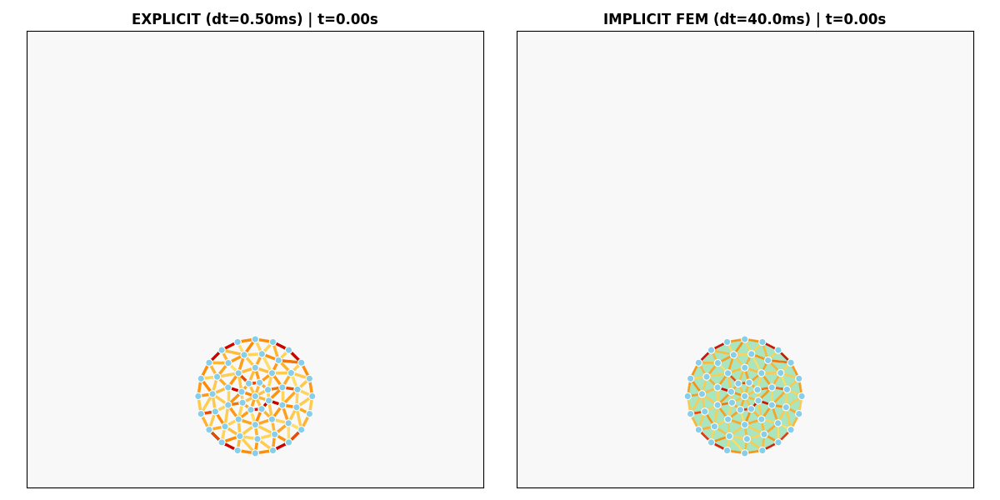

In [44]:
from IPython.display import Image as IPImage
IPImage(filename='soft_body_comparison.gif')

---
## 7. Results

In [45]:
# Step 10: Comparison
steps_exp = int(sim_time / dt_exp)
steps_imp = int(sim_time / dt_imp)

print("=" * 60)
print("         EXPLICIT vs IMPLICIT COMPARISON")
print("=" * 60)
print(f"{'Property':<20} {'Explicit':<18} {'Implicit FEM':<18}")
print("-" * 60)
print(f"{'Timestep':<20} {dt_exp*1000:.2f} ms{'':<10} {dt_imp*1000:.1f} ms")
print(f"{'Steps':<20} {steps_exp:,}{'':<10} {steps_imp:,}")
print(f"{'Wall time':<20} {time_exp:.2f} s{'':<11} {time_imp:.2f} s")
print(f"{'Steps/sec':<20} {steps_exp/time_exp:,.0f}{'':<10} {steps_imp/time_imp:,.0f}")
print("-" * 60)
print(f"{'Stability':<20} {'Conditional':<18} {'Unconditional':<18}")
print(f"{'Volume preserve':<20} {'No (springs)':<18} {'Yes (FEM)':<18}")
print("=" * 60)
print(f"\n>>> Implicit uses {dt_imp/dt_exp:.0f}x larger timesteps!")

         EXPLICIT vs IMPLICIT COMPARISON
Property             Explicit           Implicit FEM      
------------------------------------------------------------
Timestep             0.50 ms           40.0 ms
Steps                20,000           250
Wall time            3.86 s            1.60 s
Steps/sec            5,181           157
------------------------------------------------------------
Stability            Conditional        Unconditional     
Volume preserve      No (springs)       Yes (FEM)         

>>> Implicit uses 80x larger timesteps!


---
## 8. Summary

**Key Takeaways:**
- **Explicit:** Simple but conditionally stable ($\Delta t \propto 1/\sqrt{k}$)
- **Implicit:** Unconditionally stable → huge timesteps
- **FEM:** Volume preservation that springs cannot provide

**Reference:** Baraff & Witkin, "[Large Steps in Cloth Simulation](https://www.cs.cmu.edu/~baraff/papers/sig98.pdf)," SIGGRAPH 1998

---
# Part 2: SDF-Based Collision with Terrain

Now we extend the simulation to handle **arbitrary terrain** using a **Signed Distance Field (SDF)**.

**What is an SDF?**
- A 2D field where each pixel stores distance to nearest boundary
- Positive = inside passable area, Negative = inside wall
- Enables efficient collision detection and smooth normals

**Workflow:**
1. Load a bitmap image (white = passable, black = wall)
2. Compute SDF using distance transform
3. Sample SDF in GPU kernels for collision detection

## 9. SDF Sampling Kernel

Bilinear interpolation for smooth SDF sampling on GPU.

In [46]:
# Step 11: SDF Bilinear Sampling Function
@wp.func
def bilinear_sample(
    data: wp.array2d(dtype=float),
    px: float, py: float,
    width: int, height: int,
) -> float:
    """Sample 2D array with bilinear interpolation."""
    px = wp.clamp(px, 0.0, float(width) - 1.001)
    py = wp.clamp(py, 0.0, float(height) - 1.001)
    
    x0 = int(px)
    y0 = int(py)
    x1 = wp.min(x0 + 1, width - 1)
    y1 = wp.min(y0 + 1, height - 1)
    
    fx = px - float(x0)
    fy = py - float(y0)
    
    v00 = data[y0, x0]
    v01 = data[y0, x1]
    v10 = data[y1, x0]
    v11 = data[y1, x1]
    
    v0 = v00 * (1.0 - fx) + v01 * fx
    v1 = v10 * (1.0 - fx) + v11 * fx
    
    return v0 * (1.0 - fy) + v1 * fy

print("SDF sampling function defined")

SDF sampling function defined


## 10. SDF Collision Kernel

Apply collision response using the SDF:
1. Convert world position to pixel coordinates
2. Sample SDF to check if inside wall (negative)
3. Use gradient for surface normal
4. Push particle out and reflect velocity

In [47]:
# Step 12: SDF Collision Kernel
@wp.kernel
def apply_sdf_collision_2d(
    x: wp.array(dtype=wp.vec2),
    v: wp.array(dtype=wp.vec2),
    sdf: wp.array2d(dtype=float),
    sdf_grad_x: wp.array2d(dtype=float),
    sdf_grad_y: wp.array2d(dtype=float),
    resolution: float,
    origin_x: float,
    origin_y: float,
    width: int,
    height: int,
    restitution: float,
    colliding: wp.array(dtype=int),
):
    """Apply SDF-based collision detection and response."""
    tid = wp.tid()
    colliding[tid] = 0
    
    pos = x[tid]
    vel = v[tid]
    
    # World to pixel coordinates
    px = (pos[0] - origin_x) * resolution
    py = (pos[1] - origin_y) * resolution
    
    # Bounds check
    if px < 0.0 or px >= float(width) or py < 0.0 or py >= float(height):
        world_w = float(width) / resolution
        world_h = float(height) / resolution
        
        if pos[0] < origin_x:
            pos = wp.vec2(origin_x + 0.01, pos[1])
            vel = wp.vec2(wp.abs(vel[0]) * restitution, vel[1])
        elif pos[0] > origin_x + world_w:
            pos = wp.vec2(origin_x + world_w - 0.01, pos[1])
            vel = wp.vec2(-wp.abs(vel[0]) * restitution, vel[1])
        
        if pos[1] < origin_y:
            pos = wp.vec2(pos[0], origin_y + 0.01)
            vel = wp.vec2(vel[0], wp.abs(vel[1]) * restitution)
        elif pos[1] > origin_y + world_h:
            pos = wp.vec2(pos[0], origin_y + world_h - 0.01)
            vel = wp.vec2(vel[0], -wp.abs(vel[1]) * restitution)
        
        x[tid] = pos
        v[tid] = vel
        return
    
    # Sample SDF (convert to world units)
    sdf_value = bilinear_sample(sdf, px, py, width, height) / resolution
    
    # Mark as colliding (hot pink) when close to terrain
    if sdf_value < 0.1:  # Proximity threshold for visual feedback
        colliding[tid] = 1
    
    # Collision response: only when actually inside wall
    if sdf_value < 0.0:
        # Get normal from gradient
        grad_x = bilinear_sample(sdf_grad_x, px, py, width, height)
        grad_y = bilinear_sample(sdf_grad_y, px, py, width, height)
        
        grad_len = wp.sqrt(grad_x * grad_x + grad_y * grad_y)
        if grad_len > 1e-6:
            normal = wp.vec2(grad_x / grad_len, grad_y / grad_len)
        else:
            normal = wp.vec2(0.0, 1.0)
        
        # Push out of wall
        penetration = -sdf_value
        pos = pos + normal * (penetration + 0.01)
        
        # Reflect velocity
        v_normal = wp.dot(vel, normal)
        if v_normal < 0.0:
            vel = vel - normal * v_normal * (1.0 + restitution)
        
        x[tid] = pos
        v[tid] = vel

print("SDF collision kernel defined")

SDF collision kernel defined


## 11. WorldMap Class

Load terrain from bitmap image and compute SDF.

In [48]:
# Step 13: WorldMap Class
from PIL import Image
from scipy import ndimage

class WorldMap:
    """Load terrain from bitmap and compute SDF."""
    
    def __init__(self, image_path, resolution=50.0, origin=(0.0, 0.0)):
        self.resolution = resolution
        self.origin = np.array(origin)
        
        # Load image (white = passable, black = wall)
        img = Image.open(image_path).convert('L')
        img_array = np.array(img)
        img_array = np.flipud(img_array)  # Flip: y=0 at bottom (physics convention)
        self.bitmap = (img_array >= 128).astype(np.float32)
        
        # Compute SDF
        dist_passable = ndimage.distance_transform_edt(self.bitmap)
        dist_wall = ndimage.distance_transform_edt(1 - self.bitmap)
        self.sdf = (dist_passable - dist_wall).astype(np.float32)
        
        # Gradient for normals
        self.sdf_grad_x = ndimage.sobel(self.sdf, axis=1).astype(np.float32)
        self.sdf_grad_y = ndimage.sobel(self.sdf, axis=0).astype(np.float32)
        
        self.width = self.bitmap.shape[1]
        self.height = self.bitmap.shape[0]
        self.world_size = (self.width / resolution, self.height / resolution)
        
        print(f"WorldMap: {self.width}x{self.height} px, world size: {self.world_size[0]:.2f}x{self.world_size[1]:.2f}")
    
    def to_warp(self, device='cuda'):
        """Convert to Warp arrays for GPU."""
        return {
            'sdf': wp.array2d(self.sdf, dtype=float, device=device),
            'sdf_grad_x': wp.array2d(self.sdf_grad_x, dtype=float, device=device),
            'sdf_grad_y': wp.array2d(self.sdf_grad_y, dtype=float, device=device),
            'resolution': self.resolution,
            'origin_x': float(self.origin[0]),
            'origin_y': float(self.origin[1]),
            'width': self.width,
            'height': self.height,
        }

print("WorldMap class defined")

WorldMap class defined


## 12. Load Terrain Map

Load `map.png` and visualize the SDF.

WorldMap: 318x250 px, world size: 6.36x5.00


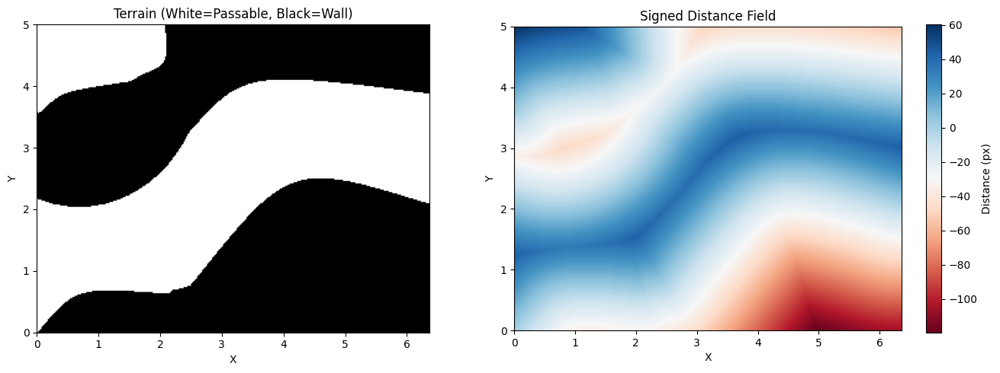

In [49]:
# Step 14: Load Map
world_map = WorldMap('map.png', resolution=50.0, origin=(0.0, 0.0))
sdf_data = world_map.to_warp()

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(world_map.bitmap, cmap='gray', origin='lower',
               extent=[0, world_map.world_size[0], 0, world_map.world_size[1]])
axes[0].set_title('Terrain (White=Passable, Black=Wall)')
axes[0].set_xlabel('X'); axes[0].set_ylabel('Y')

im = axes[1].imshow(world_map.sdf, cmap='RdBu', origin='lower',
                    extent=[0, world_map.world_size[0], 0, world_map.world_size[1]])
axes[1].set_title('Signed Distance Field')
axes[1].set_xlabel('X'); axes[1].set_ylabel('Y')
plt.colorbar(im, ax=axes[1], label='Distance (px)')
plt.tight_layout()
plt.savefig('sdf_visualization.png', dpi=100)
plt.show()

## 13. Implicit Solver with SDF Collision

Extend `SolverImplicitFEM` to use SDF-based collision instead of box boundaries.

In [50]:
# Step 15: Solver with SDF Collision
class SolverImplicitFEM_SDF(SolverImplicitFEM):
    """Implicit FEM solver with SDF terrain collision."""
    
    def __init__(self, model, sdf_data, dt=0.01, mass=1.0):
        super().__init__(model, dt, mass)
        self.sdf_data = sdf_data
        self.colliding = wp.zeros(model.particle_count, dtype=int, device=model.device)
    
    def step(self, state_in, state_out, dt):
        # Run parent step (physics integration)
        super().step(state_in, state_out, dt)
        
        # Replace box boundary with SDF collision
        wp.launch(apply_sdf_collision_2d, dim=self.model.particle_count, inputs=[
            state_out.particle_q, state_out.particle_qd,
            self.sdf_data['sdf'], self.sdf_data['sdf_grad_x'], self.sdf_data['sdf_grad_y'],
            self.sdf_data['resolution'], self.sdf_data['origin_x'], self.sdf_data['origin_y'],
            self.sdf_data['width'], self.sdf_data['height'], 0.3,  # restitution
            self.colliding
        ], device=self.model.device)
        
        return state_out

print("SolverImplicitFEM_SDF defined")

SolverImplicitFEM_SDF defined


## 14. Run Terrain Simulation

Drop the soft body onto the terrain!

In [51]:
# Step 16: Run SDF Simulation
# Create model centered over terrain
center_x = world_map.world_size[0] / 2
center_y = world_map.world_size[1] * 0.6  # Start in middle-upper area

model_sdf = Model.from_circle(
    radius=0.5, num_boundary=20, num_rings=3,  # Same as Part 1
    boxsize=max(world_map.world_size), 
    center=(center_x, center_y)
)
model_sdf.set_gravity((0.0, -0.3))  # Gentler gravity for visible FEM

solver_sdf = SolverImplicitFEM_SDF(model_sdf, sdf_data, dt=0.02)

# Simulation
dt_sdf = 0.02
sim_time_sdf = 10.0
steps_sdf = int(sim_time_sdf / dt_sdf)

s_in, s_out = model_sdf.state(), model_sdf.state()

print(f"Running {steps_sdf} steps on terrain...")
start = time.time()

frames_sdf = []
for step in range(steps_sdf):
    solver_sdf.step(s_in, s_out, dt_sdf)
    s_in, s_out = s_out, s_in
    
    if step % 2 == 0:
        frames_sdf.append((
            s_in.particle_q.numpy().copy(),
            model_sdf.spring_strains.numpy().copy(),
            model_sdf.tri_strains.numpy().copy(),
            solver_sdf.colliding.numpy().copy(),
            step * dt_sdf
        ))

elapsed_sdf = time.time() - start
print(f"Completed in {elapsed_sdf:.2f}s ({steps_sdf/elapsed_sdf:.0f} steps/s), {len(frames_sdf)} frames")

Circle: 54 particles, 139 springs, 86 triangles
Running 500 steps on terrain...
Module __main__ e8e848e load on device 'cuda:0' took 1648.53 ms  (compiled)
Completed in 5.68s (88 steps/s), 250 frames


## 15. Terrain Animation

In [52]:
# Step 17: Create Terrain Animation
from matplotlib.colors import LinearSegmentedColormap

fig, ax = plt.subplots(figsize=(12, 8))
fig.patch.set_facecolor('white')

spring_idx_sdf = model_sdf.spring_indices.numpy().reshape(-1, 2)
tri_sdf = model_sdf.tri_indices.numpy().reshape(-1, 3)

# Same colormaps as Part 1
cmap_spring = LinearSegmentedColormap.from_list('spring', ['#FFE066', '#FF8800', '#CC0000'])
cmap_fem = LinearSegmentedColormap.from_list('fem', ['#88DDAA', '#00AACC', '#0044AA'])

def update_sdf(idx):
    pos, strain_spr, strain_fem, coll, t = frames_sdf[idx]
    ax.clear()
    ax.set_facecolor('#f8f8f8')
    
    # Draw terrain very faint in background
    ax.imshow(world_map.bitmap, cmap='Greys_r', origin='lower', alpha=0.8,
              extent=[0, world_map.world_size[0], 0, world_map.world_size[1]])
    
    # Draw FEM triangles FIRST (background layer)
    triang = Triangulation(pos[:,0], pos[:,1], tri_sdf)
    ax.tripcolor(triang, np.clip(np.abs(strain_fem)/max(0.02, np.abs(strain_fem).max()), 0, 1), 
                 cmap=cmap_fem, vmin=0, vmax=1, alpha=0.85)
    
    # Draw springs on TOP of FEM
    segs = [[pos[v0], pos[v1]] for v0, v1 in spring_idx_sdf]
    lc = LineCollection(segs, cmap=cmap_spring, linewidths=2.0)
    lc.set_array(np.clip(np.abs(strain_spr)/max(0.02, np.abs(strain_spr).max()), 0, 1))
    ax.add_collection(lc)
    
    # Draw particles on TOP - PINK when colliding, light blue otherwise
    colors = ['#FF69B4' if c else '#87CEEB' for c in coll]
    ax.scatter(pos[:,0], pos[:,1], s=35, c=colors, edgecolors='white', linewidths=0.8, zorder=5)
    
    ax.set_xlim(0, world_map.world_size[0])
    ax.set_ylim(0, world_map.world_size[1])
    ax.set_aspect('equal')
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_title(f'Soft Body on Terrain | t={t:.2f}s', fontsize=14, fontweight='bold')

anim_sdf = FuncAnimation(fig, update_sdf, frames=len(frames_sdf), interval=40, blit=False)
anim_sdf.save('soft_body_terrain.gif', writer=PillowWriter(fps=25))
plt.close()
print(f"Saved soft_body_terrain.gif ({len(frames_sdf)} frames)")

Saved soft_body_terrain.gif (250 frames)


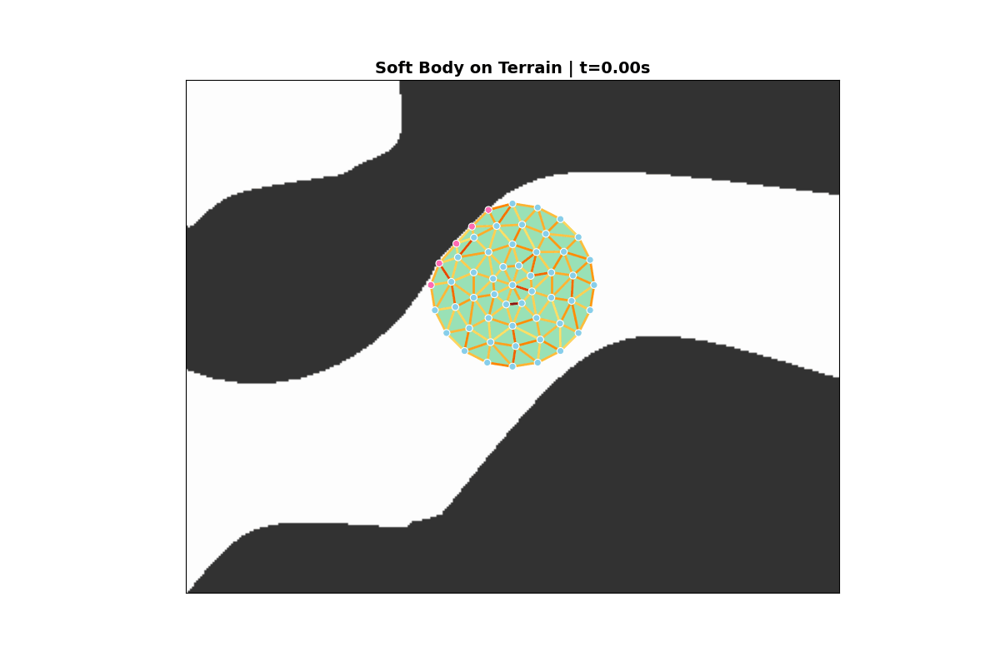

In [53]:
from IPython.display import Image as IPImage
IPImage(filename='soft_body_terrain.gif')

---
## Summary: SDF Collision

**What we added:**
1. **SDF Sampling** - Bilinear interpolation for smooth distance queries
2. **Collision Kernel** - GPU-accelerated collision detection using SDF
3. **WorldMap** - Load terrain from bitmap, compute SDF with scipy
4. **Extended Solver** - Combine implicit FEM with terrain collision

**Key Benefits of SDF:**
- **Arbitrary geometry** - Any shape from a bitmap image
- **Smooth normals** - Gradient gives continuous surface direction
- **Efficient** - O(1) lookup per particle
- **Resolution independent** - Bilinear interpolation

**Reference Code:**
- `soft_robotics/warp/world/kernels_sdf.py`
- `soft_robotics/world_map/world_map.py`